In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
from skimage import io
import albumentations as albu

In [2]:
dog = io.imread('data/images/dog_face.jpg')

In [3]:
points = [(120, 1750), (470, 1560), (800, 1460), (1250, 1200), (1540, 1150), (1840, 1200),
            (2250, 1180), (2540, 1140), (3000, 1520), (3560, 1700), (820, 1750), (1300, 1700),
            (2350, 1720), (2800, 1750), (270, 2300), (1200, 2300), (1750, 2000), (2300, 2300), (3400, 2300)]

In [4]:
def visualize_points(dog, points, diameter=24):

    im = dog.copy()

    for (x, y) in points:
        cv2.circle(im, (int(x), int(y)), diameter, (0, 255, 0), -1)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(im)

In [5]:
def transformer(transformations):
    return albu.Compose(transformations,
                            p=1,
                            keypoint_params={'format': 'xy'})(image=dog, keypoints=points)

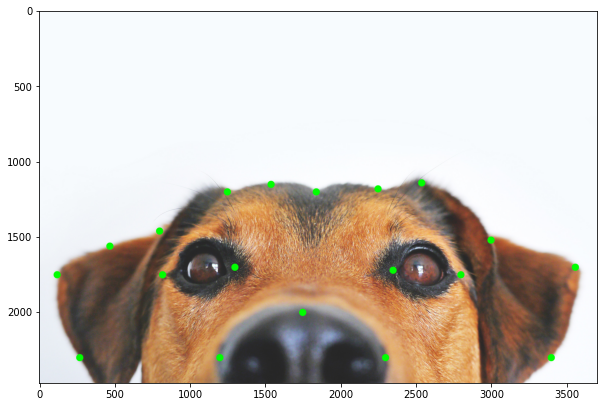

In [6]:
visualize_points(dog, points)

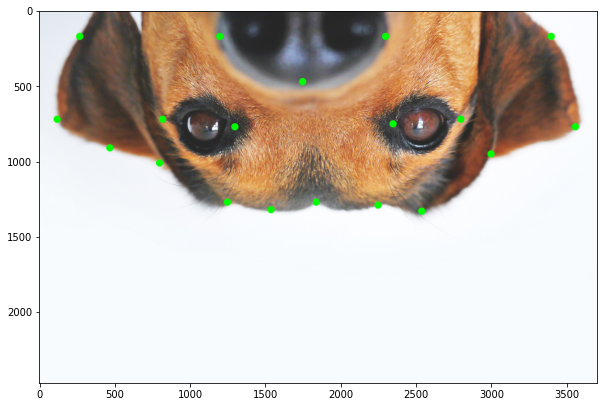

In [7]:
transformed_img = transformer([albu.VerticalFlip(p=1)])
key_points = transformed_img['keypoints']
im = transformed_img['image']
visualize_points(im, key_points)

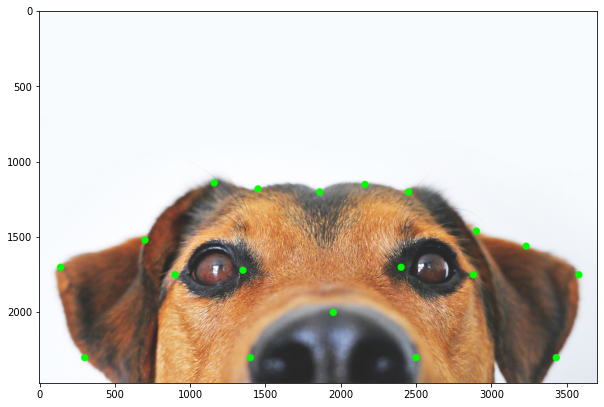

In [8]:
transformed_img = transformer([albu.HorizontalFlip(p=1)])
key_points = transformed_img['keypoints']
im = transformed_img['image']
visualize_points(im, key_points)

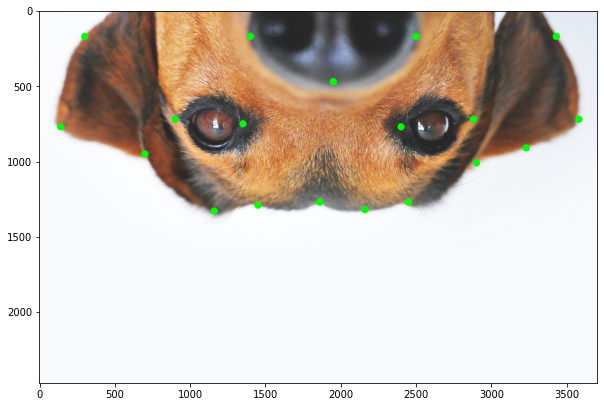

In [9]:
transformed_img = transformer([albu.Flip(p=1)])
key_points = transformed_img['keypoints']
im = transformed_img['image']
visualize_points(im, key_points)

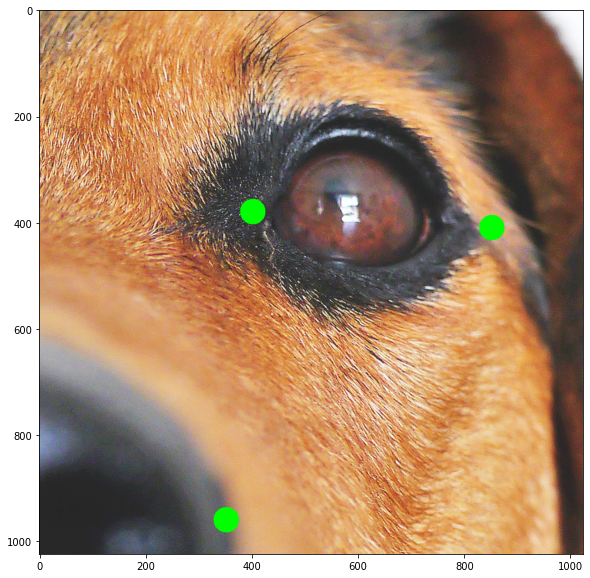

In [10]:
transformed_img = transformer([albu.RandomCrop(width=1024, height=1024, p=1)])
key_points = transformed_img['keypoints']
im = transformed_img['image']
visualize_points(im, key_points)

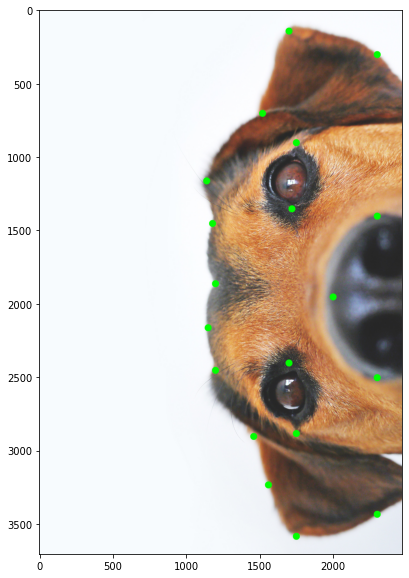

In [12]:
transformed_img = transformer([albu.RandomRotate90(p=1)])
key_points = transformed_img['keypoints']
im = transformed_img['image']
visualize_points(im, key_points)

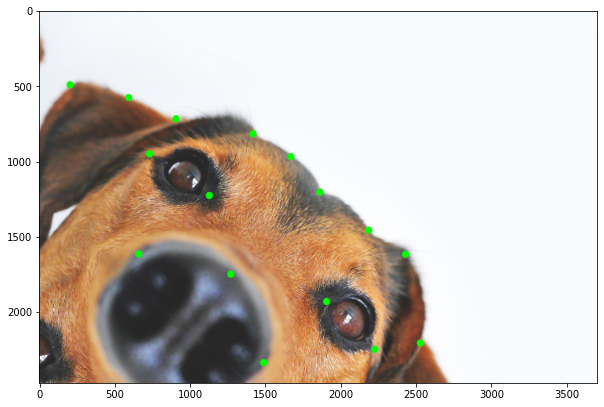

In [13]:
transformed_img = transformer([albu.Rotate(p=1)])
key_points = transformed_img['keypoints']
im = transformed_img['image']
visualize_points(im, key_points)

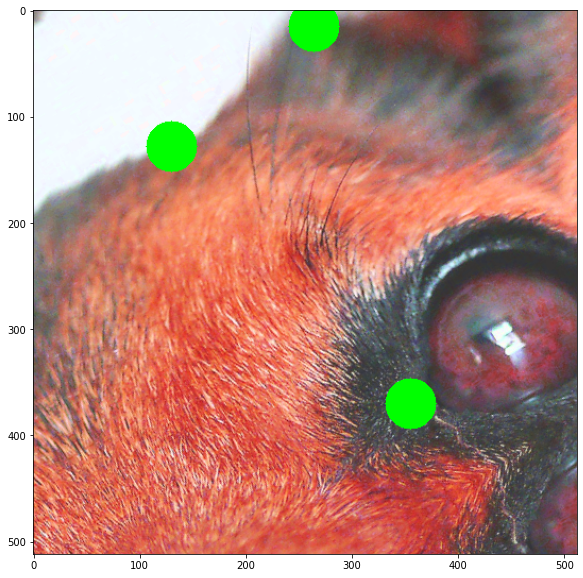

In [16]:
transformed_img = transformer([
    albu.RandomSizedCrop(min_max_height=(256, 1024), height=512, width=512, p=0.8),
    albu.ShiftScaleRotate(p=1),
    albu.OneOf([
        albu.HueSaturationValue(p=0.5),
        albu.RGBShift(p=0.7)
    ], p=1),
    albu.RandomBrightnessContrast(p=0.5)
])
key_points = transformed_img['keypoints']
im = transformed_img['image']
visualize_points(im, key_points)

In [17]:
from skimage.transform import resize

In [18]:
img1 = cv2.imread('data/images/taj_small.jpg')

In [19]:
img1.shape

(540, 999, 3)

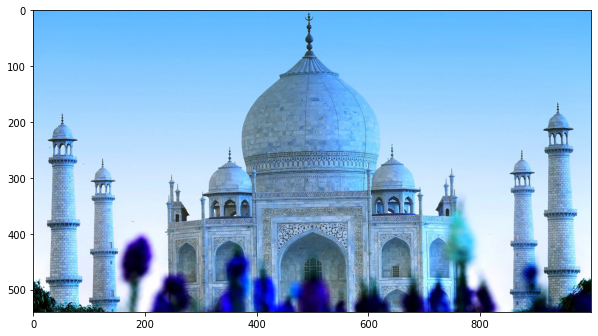

In [20]:
plt.figure(figsize=(10, 10))
plt.imshow(img1);

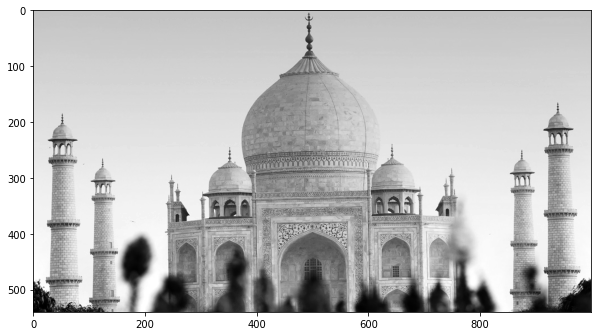

In [21]:
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(10, 10))
plt.imshow(gray1, cmap='gray');

## Scale Invariant Feature Transform (SIFT)

In [23]:
sift = cv2.SIFT_create()
sift

<SIFT 000001AAB6DE8770>

In [25]:
kp1 = sift.detect(gray1, None)
kp1

(<KeyPoint 000001AAB6A97F30>,
 <KeyPoint 000001AAB6A97900>,
 <KeyPoint 000001AAB6A976F0>,
 <KeyPoint 000001AAB6113F00>,
 <KeyPoint 000001AAB5F5D630>,
 <KeyPoint 000001AAB5F5DF30>,
 <KeyPoint 000001AAB61AAF30>,
 <KeyPoint 000001AAB6A79F60>,
 <KeyPoint 000001AAB6F08D80>,
 <KeyPoint 000001AAB6F08DB0>,
 <KeyPoint 000001AAB6F08DE0>,
 <KeyPoint 000001AAB6F08E10>,
 <KeyPoint 000001AAB6F08E40>,
 <KeyPoint 000001AAB6F08B70>,
 <KeyPoint 000001AAB6F08BA0>,
 <KeyPoint 000001AAB6F08E70>,
 <KeyPoint 000001AAB6F08EA0>,
 <KeyPoint 000001AAB6F08ED0>,
 <KeyPoint 000001AAB6F08C60>,
 <KeyPoint 000001AAB6F08F00>,
 <KeyPoint 000001AAB6F08F30>,
 <KeyPoint 000001AAB6F08F60>,
 <KeyPoint 000001AAB6F08F90>,
 <KeyPoint 000001AAB6F08FC0>,
 <KeyPoint 000001AAB6F08A80>,
 <KeyPoint 000001AAB6F08AB0>,
 <KeyPoint 000001AAB6F08B10>,
 <KeyPoint 000001AAB6F08A50>,
 <KeyPoint 000001AAB6F08AE0>,
 <KeyPoint 000001AAB6F0C030>,
 <KeyPoint 000001AAB6F0C060>,
 <KeyPoint 000001AAB6F0C090>,
 <KeyPoint 000001AAB6F0C0C0>,
 <KeyPoint

In [26]:
img1 = cv2.drawKeypoints(gray1, kp1, outImage=None)

In [27]:
cv2.imwrite('sift_keypoints.jpg', img1)

True

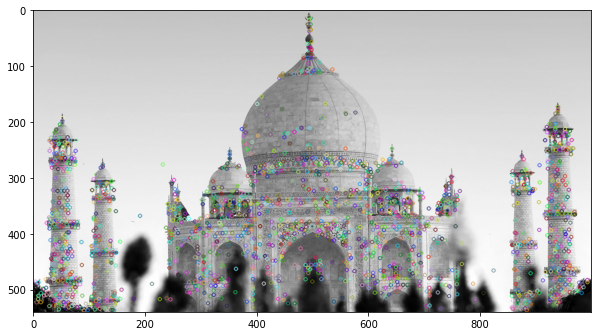

In [28]:
plt.figure(figsize=(10, 10))
plt.imshow(img1);

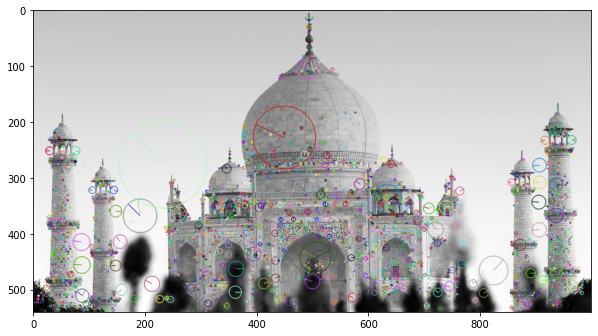

In [29]:
img2 = cv2.drawKeypoints(gray1, kp1, outImage=None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(10, 10))
plt.imshow(img2);

In [30]:
kp1, des1 = sift.compute(gray1, kp1)

In [31]:
des1.shape

(2236, 128)

In [32]:
img3 = cv2.imread('data/images/taj_mahal_india.jpg')
img3.shape

(576, 1024, 3)

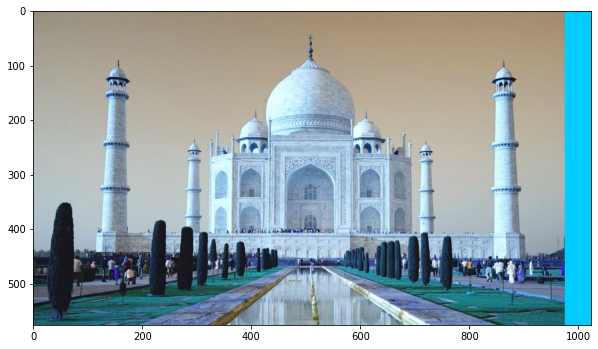

In [33]:
plt.figure(figsize=(10, 10))
plt.imshow(img3);

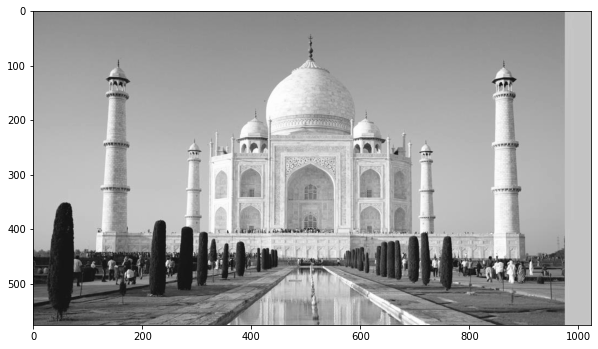

In [34]:
gray2 = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(10, 10))
plt.imshow(gray2, cmap='gray');

In [35]:
kp2, des2 = sift.detectAndCompute(gray2, None)

In [36]:
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False) # Brute Force Descriptor Matcher
matches = bf.match(des1, des2)

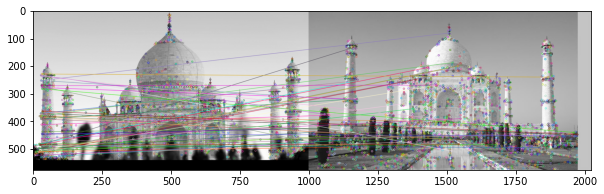

In [37]:
N_MATCHES = 50

match_img = cv2.drawMatches(
                            gray1, kp1,
                            gray2, kp2,
                            matches[:N_MATCHES],
                            gray2.copy(),
                            flags=0
)
plt.figure(figsize=(10, 10))
plt.imshow(match_img);

## DAISY

In [39]:
import skimage
from skimage import color, data
from skimage.feature import daisy

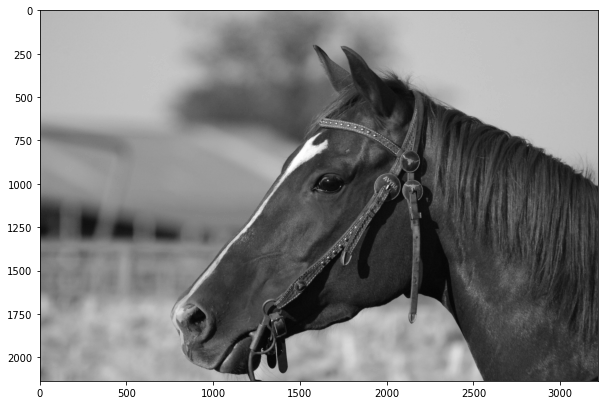

In [40]:
horse = color.rgb2gray(skimage.io.imread('data/images/horse.jpg'))
plt.figure(figsize=(10, 10))
plt.imshow(horse, cmap='gray');

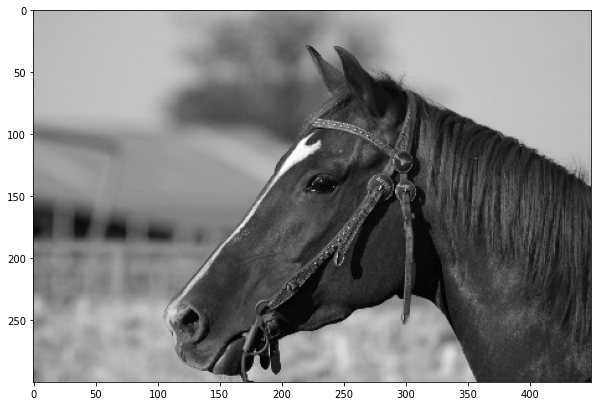

In [41]:
horse = resize(horse, (300, 450), mode='reflect', anti_aliasing=False)
plt.figure(figsize=(10, 10))
plt.imshow(horse, cmap='gray');

In [42]:
descs_array, descs_image = daisy(horse, step=150, radius=30, visualize=True)

In [43]:
descs_num = descs_array.shape[0] * descs_array.shape[1]
descs_num

6

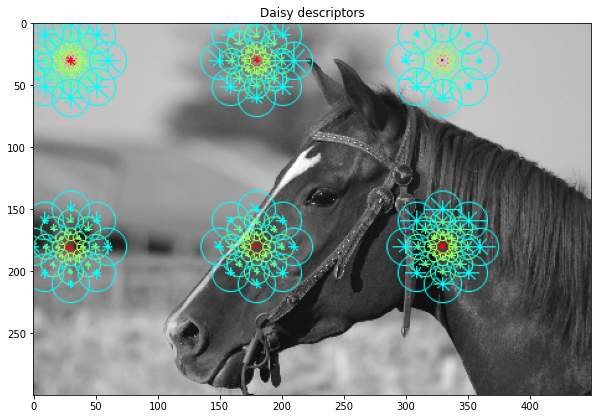

In [44]:
plt.figure(figsize=(10, 10))
plt.title('Daisy descriptors')
plt.imshow(descs_image, cmap='gray');

## Histogram of Oriented Gradients (HOG)

In [45]:
from skimage import exposure
from skimage.feature import hog

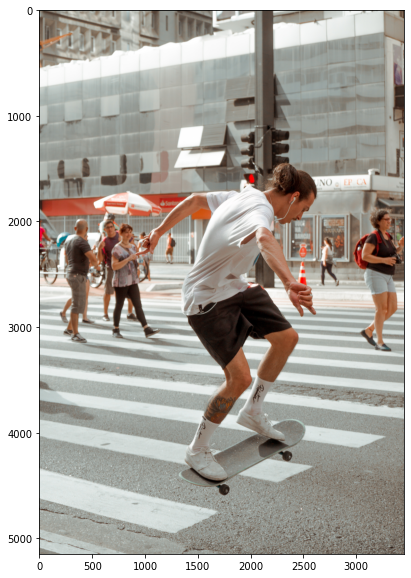

In [46]:
man = skimage.io.imread('data/images/crossing.jpg')
plt.figure(figsize=(10, 10))
plt.imshow(man);

In [47]:
man.shape

(5147, 3453, 3)

(3047, 2053, 3)


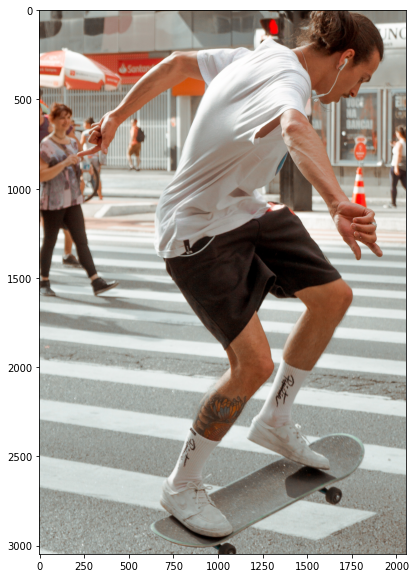

In [48]:
cropped_img = skimage.util.crop(man, ((1500, 600), (700, 700), (0, 0)), copy=False)
print(cropped_img.shape)
plt.figure(figsize=(10, 10))
plt.imshow(cropped_img);

(256, 256, 3)


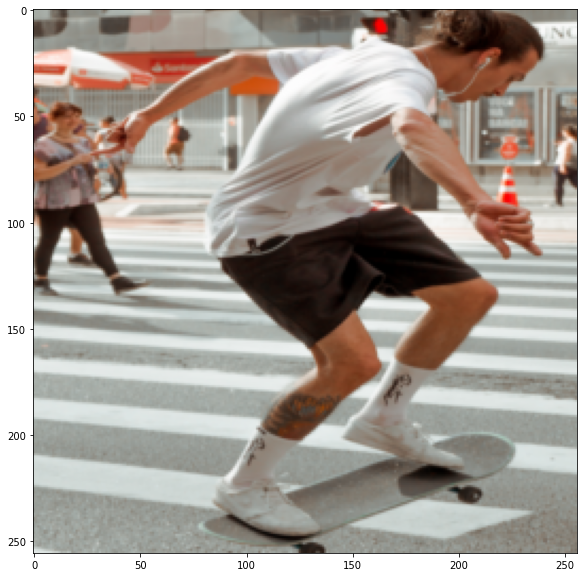

In [49]:
resized_img = resize(cropped_img, (256, 256), mode='reflect', anti_aliasing=True)
print(resized_img.shape)
plt.figure(figsize=(10, 10))
plt.imshow(resized_img);

In [50]:
fd, hog_image = hog(
    resized_img,
    pixels_per_cell=(16, 16),
    block_norm='L2-Hys',
    visualize=True,
    multichannel=True
)

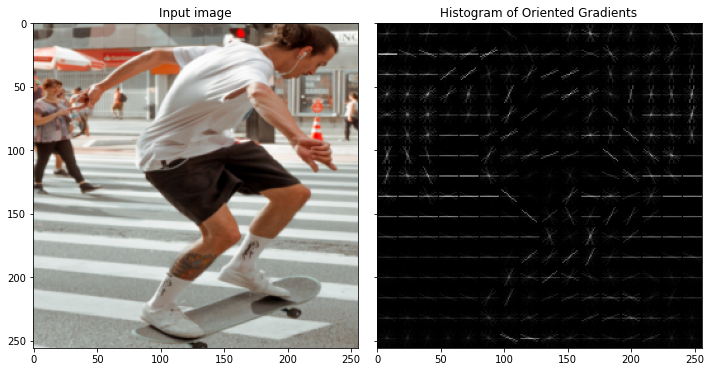

In [51]:
fig, axes = plt.subplots(1, 2, figsize=(10, 10), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(resized_img, cmap=plt.cm.gray)
ax[0].set_title('Input image')
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
ax[1].imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax[1].set_title('Histogram of Oriented Gradients')
plt.tight_layout()
plt.show();

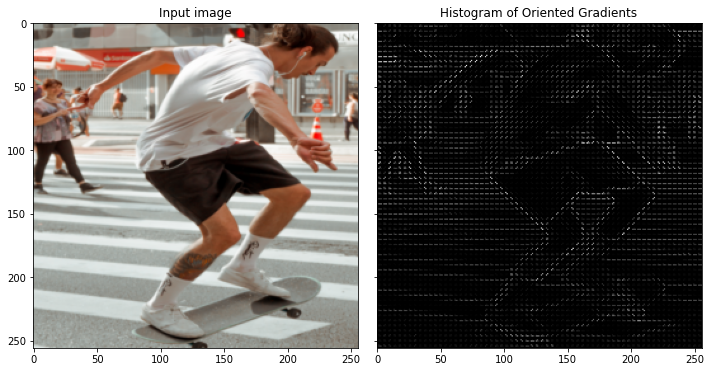

In [53]:
fd, hog_image = hog(
    resized_img,
    pixels_per_cell=(4, 4),
    block_norm='L2-Hys',
    visualize=True,
    multichannel=True
)
fig, axes = plt.subplots(1, 2, figsize=(10, 10), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(resized_img, cmap=plt.cm.gray)
ax[0].set_title('Input image')
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
ax[1].imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax[1].set_title('Histogram of Oriented Gradients')
plt.tight_layout()
plt.show();

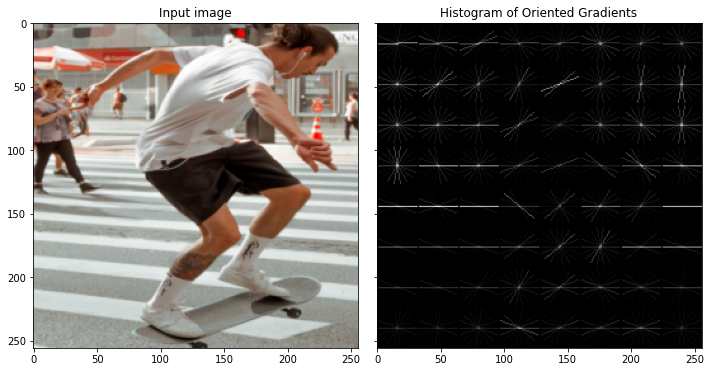

In [54]:
fd, hog_image = hog(
    resized_img,
    pixels_per_cell=(32, 32),
    block_norm='L2-Hys',
    visualize=True,
    multichannel=True
)
fig, axes = plt.subplots(1, 2, figsize=(10, 10), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(resized_img, cmap=plt.cm.gray)
ax[0].set_title('Input image')
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
ax[1].imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax[1].set_title('Histogram of Oriented Gradients')
plt.tight_layout()
plt.show();

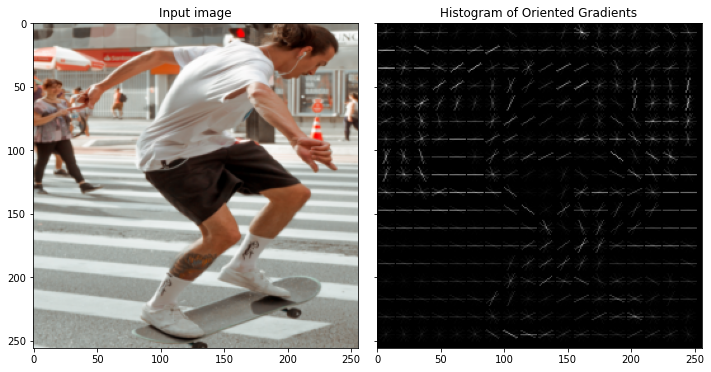

In [56]:
fd, hog_image_L1 = hog(
    resized_img,
    pixels_per_cell=(14, 14),
    block_norm='L1',
    visualize=True,
    multichannel=True
)
fig, axes = plt.subplots(1, 2, figsize=(10, 10), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(resized_img, cmap=plt.cm.gray)
ax[0].set_title('Input image')
hog_image_rescaled_L1 = exposure.rescale_intensity(hog_image_L1, in_range=(0, 10))
ax[1].imshow(hog_image_rescaled_L1, cmap=plt.cm.gray)
ax[1].set_title('Histogram of Oriented Gradients')
plt.tight_layout()
plt.show();

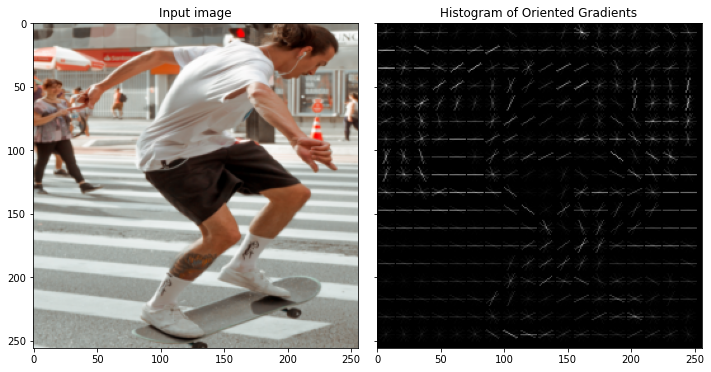

In [57]:
fd, hog_image_L1_sqrt = hog(
    resized_img,
    pixels_per_cell=(14, 14),
    block_norm='L1-sqrt',
    visualize=True,
    multichannel=True
)
fig, axes = plt.subplots(1, 2, figsize=(10, 10), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(resized_img, cmap=plt.cm.gray)
ax[0].set_title('Input image')
hog_image_rescaled_L1_sqrt = exposure.rescale_intensity(hog_image_L1_sqrt, in_range=(0, 10))
ax[1].imshow(hog_image_rescaled_L1_sqrt, cmap=plt.cm.gray)
ax[1].set_title('Histogram of Oriented Gradients')
plt.tight_layout()
plt.show();

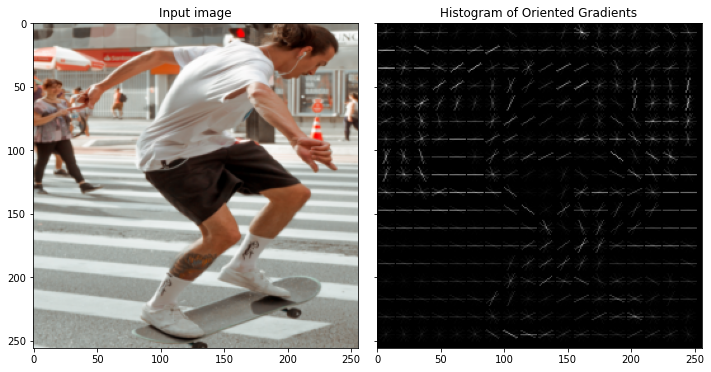

In [58]:
fd, hog_image_L2 = hog(
    resized_img,
    pixels_per_cell=(14, 14),
    block_norm='L2',
    visualize=True,
    multichannel=True
)
fig, axes = plt.subplots(1, 2, figsize=(10, 10), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(resized_img, cmap=plt.cm.gray)
ax[0].set_title('Input image')
hog_image_rescaled_L2 = exposure.rescale_intensity(hog_image_L2, in_range=(0, 10))
ax[1].imshow(hog_image_rescaled_L2, cmap=plt.cm.gray)
ax[1].set_title('Histogram of Oriented Gradients')
plt.tight_layout()
plt.show();

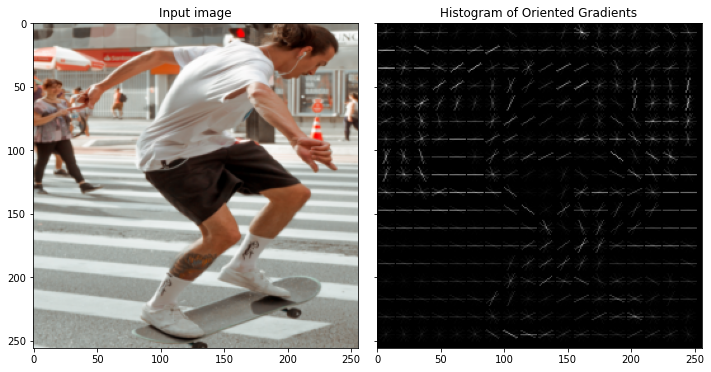

In [59]:
fd, hog_image_L2_Hys = hog(
    resized_img,
    pixels_per_cell=(14, 14),
    block_norm='L2-Hys',
    visualize=True,
    multichannel=True
)
fig, axes = plt.subplots(1, 2, figsize=(10, 10), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(resized_img, cmap=plt.cm.gray)
ax[0].set_title('Input image')
hog_image_rescaled_L2_Hys = exposure.rescale_intensity(hog_image_L2_Hys, in_range=(0, 10))
ax[1].imshow(hog_image_rescaled_L2_Hys, cmap=plt.cm.gray)
ax[1].set_title('Histogram of Oriented Gradients')
plt.tight_layout()
plt.show();